In [5]:
from load_data import sim_arr
from sklearn.model_selection import train_test_split
import torch
import sys
import os

# Add the main folder to sys.path
sys.path.append(os.path.abspath(os.path.join(os.path.dirname(__file__), '..')))


# reshape from batch, height, width, channel, to batch, channel, height, width
sim_arr_transformed = sim_arr.reshape(
    sim_arr.shape[0], sim_arr.shape[3], sim_arr.shape[1], sim_arr.shape[2])

sim_arr_tensor = torch.tensor(sim_arr_transformed, dtype=torch.float32)

# train test split
train_data, test_data = train_test_split(
    sim_arr_tensor, test_size=0.2, random_state=42, shuffle=True)

ModuleNotFoundError: No module named 'load_data'

In [3]:
from torch import nn

num_layers: 5
poolsize: [2, 2, 2, 2, 5]
channels: [3, 12, 7, 7, 11, 12]
kernel_sizes: [15, 10, 14, 14, 14]
dilations: [5, 5, 3, 3, 1]
activations: [<class 'torch.nn.modules.activation.SiLU'>, <class 'torch.nn.modules.activation.Tanh'>, <class 'torch.nn.modules.activation.Softplus'>, <class 'torch.nn.modules.activation.SiLU'>, <class 'torch.nn.modules.activation.SiLU'>]
learning_rate: 0.0002568457560593339
batch_size: 32
epochs: 200

Best trial: 98
num_layers: 5
poolsize: [2, 2, 2, 2, 5]
channels: [3, 12, 7, 7, 11, 12]
kernel_sizes: [15, 10, 14, 14, 14]
dilations: [5, 5, 3, 3, 1]
activations: [<class 'torch.nn.modules.activation.SiLU'>, <class 'torch.nn.modules.activation.Tanh'>, <class 'torch.nn.modules.activation.Softplus'>, <class 'torch.nn.modules.activation.SiLU'>, <class 'torch.nn.modules.activation.SiLU'>]
learning_rate: 0.0002568457560593339
batch_size: 32
epochs: 200
Best value: 404976.30606312293


/home/tummalas/hyper-param-optim-4-vector-field-clustering/.venv/lib/python3.9/site-packages/optuna/distributions.py:524: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 2, 2, 5] which is of type list.
  warnings.warn(message)
/home/tummalas/hyper-param-optim-4-vector-field-clustering/.venv/lib/python3.9/site-packages/optuna/distributions.py:524: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 2, 5, 2] which is of type list.
  warnings.warn(message)
/home/tummalas/hyper-param-optim-4-vector-field-clustering/.venv/lib/python3.9/site-packages/optuna/distributions.py:524: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 5, 2, 2] which is of type list.
  warnings.warn(message)
/home/tummalas/hyper-p

In [4]:
from ae import Encoder, Decoder, AutoEncoder
from cross_validation import train_model, evaluate_model

best_trial = study.best_trial

encoder = Encoder(*search_space(best_trial, 3, 10))
decoder = Decoder(encoder)
model = AutoEncoder(encoder, decoder)

train_model(model, train_data,
            lr=best_trial.params['lr'],
            batch_size=best_trial.params['batch_size'],
            epochs=best_trial.params['epochs'])
evaluate_model(model, test_data,
               batch_size=best_trial.params['batch_size'])

Test Loss: 405186.7159


405186.71594684385

In [5]:
from torchsummary import summary
summary(model, input_size=(3, 80, 80))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
        Conv2dSame-1           [-1, 12, 80, 80]           8,112
              SiLU-2           [-1, 12, 80, 80]               0
              SiLU-3           [-1, 12, 80, 80]               0
         MaxPool2d-4           [-1, 12, 40, 40]               0
        Conv2dSame-5            [-1, 7, 40, 40]           8,407
              Tanh-6            [-1, 7, 40, 40]               0
              Tanh-7            [-1, 7, 40, 40]               0
         MaxPool2d-8            [-1, 7, 20, 20]               0
        Conv2dSame-9            [-1, 7, 20, 20]           9,611
         Softplus-10            [-1, 7, 20, 20]               0
         Softplus-11            [-1, 7, 20, 20]               0
        MaxPool2d-12            [-1, 7, 10, 10]               0
       Conv2dSame-13           [-1, 11, 10, 10]          15,103
             SiLU-14           [-1, 11,

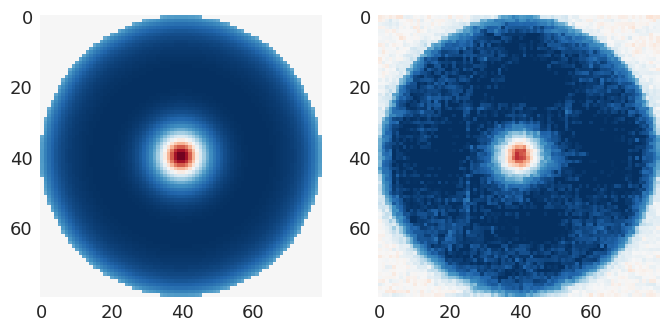

In [6]:
import numpy as np
import matplotlib.pyplot as plt

i = np.random.randint(0, len(test_data))
in_sim = test_data[i: i + 1]
in_sim = in_sim.to('cuda:0')
out_sim = model(in_sim)
in_sim = in_sim.detach().to('cpu').numpy()
in_sim = in_sim.reshape(
    in_sim.shape[0], in_sim.shape[2], in_sim.shape[3], in_sim.shape[1])
out_sim = out_sim.detach().to('cpu').numpy()
out_sim = out_sim.reshape(
    out_sim.shape[0], out_sim.shape[2], out_sim.shape[3], out_sim.shape[1])
fig, ax = plt.subplots(nrows=1, ncols=2)
ax[0].imshow(in_sim[0, ..., 2], vmin=-1, vmax=1, cmap="RdBu")
ax[1].imshow(out_sim[0, ..., 2], vmin=-1, vmax=1, cmap="RdBu")

In [28]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

feature_array = model.encoder(sim_arr_tensor.to('cuda'))
feature_array = feature_array.detach().to('cpu').numpy()
feature_array = feature_array.reshape(
    feature_array.shape[0], feature_array.shape[1])
feature_array = (feature_array - feature_array.mean()) / feature_array.std()


def objective(trial):
    eps = trial.suggest_float('eps', 0.1, 1.0)
    min_samples = trial.suggest_int('min_samples', 1, 100)
    metric = trial.suggest_categorical(
        'metric', ['euclidean', 'l1', 'l2', 'manhattan', 'cosine', 'cityblock'])
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    dbscan.fit(feature_array)
    labels = dbscan.labels_
    ss = silhouette_score(feature_array, labels)
    return ss


study = optuna.create_study(
    study_name='dbscan', direction='minimize', load_if_exists=True)
study.optimize(objective, n_trials=100)

[I 2024-07-18 14:19:21,242] A new study created in memory with name: dbscan
[I 2024-07-18 14:19:21,396] Trial 0 finished with value: 0.6530432363189537 and parameters: {'eps': 0.3012508268498807, 'min_samples': 66, 'metric': 'manhattan'}. Best is trial 0 with value: 0.6530432363189537.
[I 2024-07-18 14:19:21,585] Trial 1 finished with value: 0.3714754704892988 and parameters: {'eps': 0.6524912932308495, 'min_samples': 3, 'metric': 'manhattan'}. Best is trial 1 with value: 0.3714754704892988.
[I 2024-07-18 14:19:21,766] Trial 2 finished with value: 0.8300767459812954 and parameters: {'eps': 0.8405095314427055, 'min_samples': 55, 'metric': 'manhattan'}. Best is trial 1 with value: 0.3714754704892988.
[I 2024-07-18 14:19:21,930] Trial 3 finished with value: 0.6492718865312416 and parameters: {'eps': 0.31079626683502787, 'min_samples': 88, 'metric': 'l1'}. Best is trial 1 with value: 0.3714754704892988.
[I 2024-07-18 14:19:22,083] Trial 4 finished with value: 0.9989909268695222 and paramet

In [34]:
best_trial = study.best_trial
eps = best_trial.params['eps']
min_samples = best_trial.params['min_samples']
metric = best_trial.params['metric']

print(f"Best trial: {best_trial.number}")
print(f"eps: {eps}")
print(f"min_samples: {min_samples}")
print(f"metric: {metric}")


dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric=metric)
dbscan.fit(feature_array)
labels = dbscan.labels_

Best trial: 99
eps: 0.16093885803549854
min_samples: 27
metric: l2


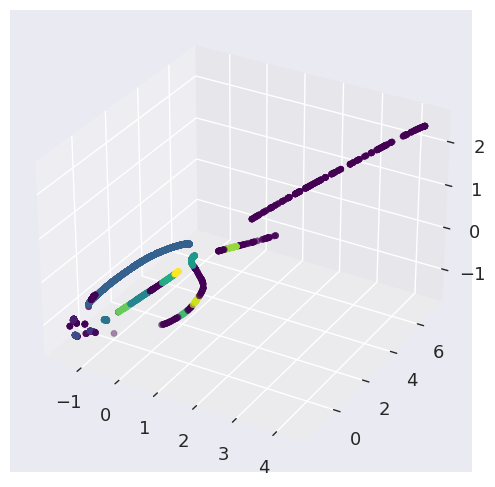

In [35]:
# plot the feature array in 3D with the labels as colors

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# feature_array = feature_array[0].detach().to('cpu').numpy()
ax.scatter(feature_array[:, 0], feature_array[:, 1],
           feature_array[:, 2], c=labels)

In [4]:
from ext_metric.cluster_acc import cluster_acc

ModuleNotFoundError: No module named 'ext_metric'

In [37]:
import plotly.express as ptx
import plotly.graph_objs as go
from load_data import parameters_dict, simulation_file_paths
print(len(set(labels)) - (1 if -1 in labels else 0))


class_dict = {f"Class {i}": list() for i in range(len(set(labels)))}
class_dict["Outliers"] = list()
for index, path in enumerate(simulation_file_paths):
    class_ = labels[index]
    if class_ == -1:
        class_dict["Outliers"].append(str(path))
    else:
        class_dict[f"Class {class_}"].append(str(path))

traces = list()
for class_id, colour in zip(class_dict, ptx.colors.qualitative.Dark24):
    traces.append(
        go.Scatter(
            x=[
                parameters_dict[f]["H"]
                for f in class_dict[class_id]
            ],
            y=[
                parameters_dict[f]["E"]
                for f in class_dict[class_id]
            ],
            mode="markers",
            name=class_id,
            opacity=0.7,
            marker=dict(
                size=11,
                color=colour,
            ),
        )
    )

fig = go.Figure(data=traces)
fig.update_layout(
    autosize=False,
    width=990,
    height=600,
    margin=dict(
        l=10,
        r=10,
        b=25,
        t=25,
    ),
    xaxis_title=r"$\mu_0 \mathbf{H} \text{ (T)}$",
    yaxis_title=r"$\Delta \text{E (J)}$",
)

13


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'marker': {'color': '#2E91E5', 'size': 11},
              'mode': 'markers',
              'name': 'Class 0',
              'opacity': 0.7,
              'type': 'scatter',
              'x': [0.104560520146578, 0.104560520146578, 0.15679231120900416,
                    0.15679231120900416, 0.06415061172236722, 0.15675005568735337,
                    0.15675005568735337, 0.10628000491945659, 0.10628000491945659,
                    0.10282549835843335, 0.048397381135607716,
                    0.029335013094577887, 0.0680853551098887, 0.09520598533519938,
                    0.06405041147039583, 0.012202489987678432, 0.10862032555585044,
                    0.10862032555585044, 0.1511396584396841, 0.1511396584396841,
                    0.1290774946406727, 0.1290774946406727, 0.0045748663348678335,
                    0.01842989869844196, 0.1467594265549136, 0.1467594265549136,
                    0.013790040024915795, 0.020055601051892014,
                    0.13120496795805647, 0.13120496795805647, 0.12314500844208708,
                    0.12314500844208708, 0.12282567902694742, 0.12282567902694742,
                    0.05556525292833445, 0.05767995912901584, 0.09896463765738081,
                    0.1200051235924728, 0.1200051235924728, 0.08067118301082754,
                    0.09343237728599144, 0.16233320056405595, 0.16233320056405595,
                    0.0049577451594033485, 0.07527286362065425,
                    0.12024626663464288, 0.12024626663464288, 0.13930175741253814,
                    0.13930175741253814, 0.10404936148175352, 0.10404936148175352,
                    0.16160298068677026, 0.16160298068677026, 0.12152269818476434,
                    0.12152269818476434],
              'y': [8.967743599999991e-19, 8.967743599999991e-19,
                    1.2633999731999997e-18, 1.2633999731999997e-18,
                    6.120387045999997e-19, 1.2631113112000002e-18,
                    1.2631113112000002e-18, 9.089289329999998e-19,
                    9.089289329999998e-19, 8.845125361000001e-19,
                    5.013983285999982e-19, 3.674512357999984e-19,
                    6.396914829999998e-19, 8.306994981e-19, 6.1133464929999835e-19,
                    2.4665453360000056e-19, 9.254756024999998e-19,
                    9.254756024999998e-19, 1.2245570329000016e-18,
                    1.2245570329000016e-18, 1.070102573e-18, 1.070102573e-18,
                    1.9263504620000243e-19, 2.9063364550000024e-19,
                    1.1941861761999996e-18, 1.1941861761999996e-18,
                    2.578755566999981e-19, 3.0209951700000217e-19,
                    1.0851114604000025e-18, 1.0851114604000025e-18,
                    1.0281957872000015e-18, 1.0281957872000015e-18,
                    1.0259384502000004e-18, 1.0259384502000004e-18,
                    5.51732372499999e-19, 5.665838933999993e-19,
                    8.572373352000002e-19, 1.0059955242000005e-18,
                    1.0059955242000005e-18, 7.282322665000001e-19,
                    8.18182591300001e-19, 1.3009923322000018e-18,
                    1.3009923322000018e-18, 1.9535125890000043e-19,
                    6.902364682000011e-19, 1.0077008012000006e-18,
                    1.0077008012000006e-18, 1.142073434700001e-18,
                    1.142073434700001e-18, 8.931615961000003e-19,
                    8.931615961000003e-19, 1.2960694989000003e-18,
                    1.2960694989000003e-18, 1.0167265328000001e-18,
                    1.0167265328000001e-18]},
             {'marker': {'color': '#E15F99', 'size': 11},
              'mode': 'markers',
              'name': 'Class 1',
              'opacity': 0.7,
              'type': 'scatter',
              'x': [0.104560520146578, 0.15679231120900416, 0.06415061172236722,
                    0.15675005568735337, 0.10628000491945659, 0.10282549835843335,
                    0.048397381135607716, 0.029335013094577887, 0.0680853551098887,


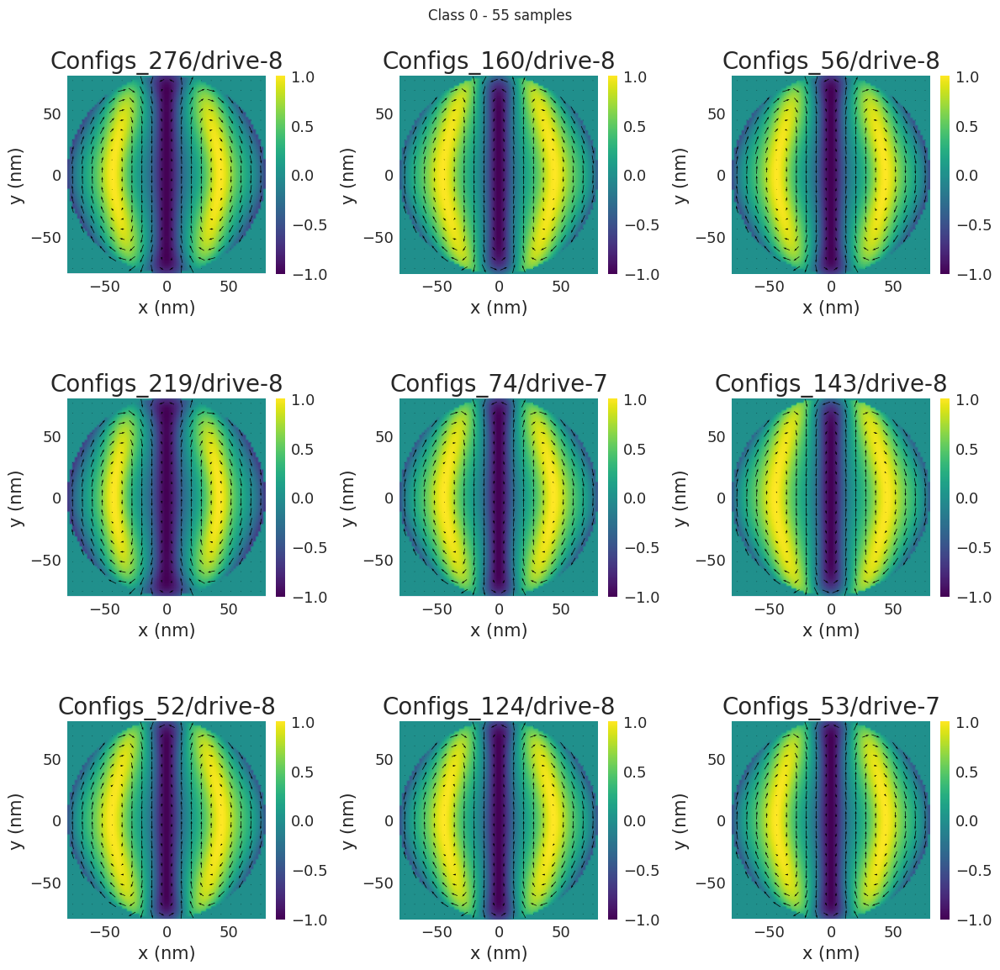

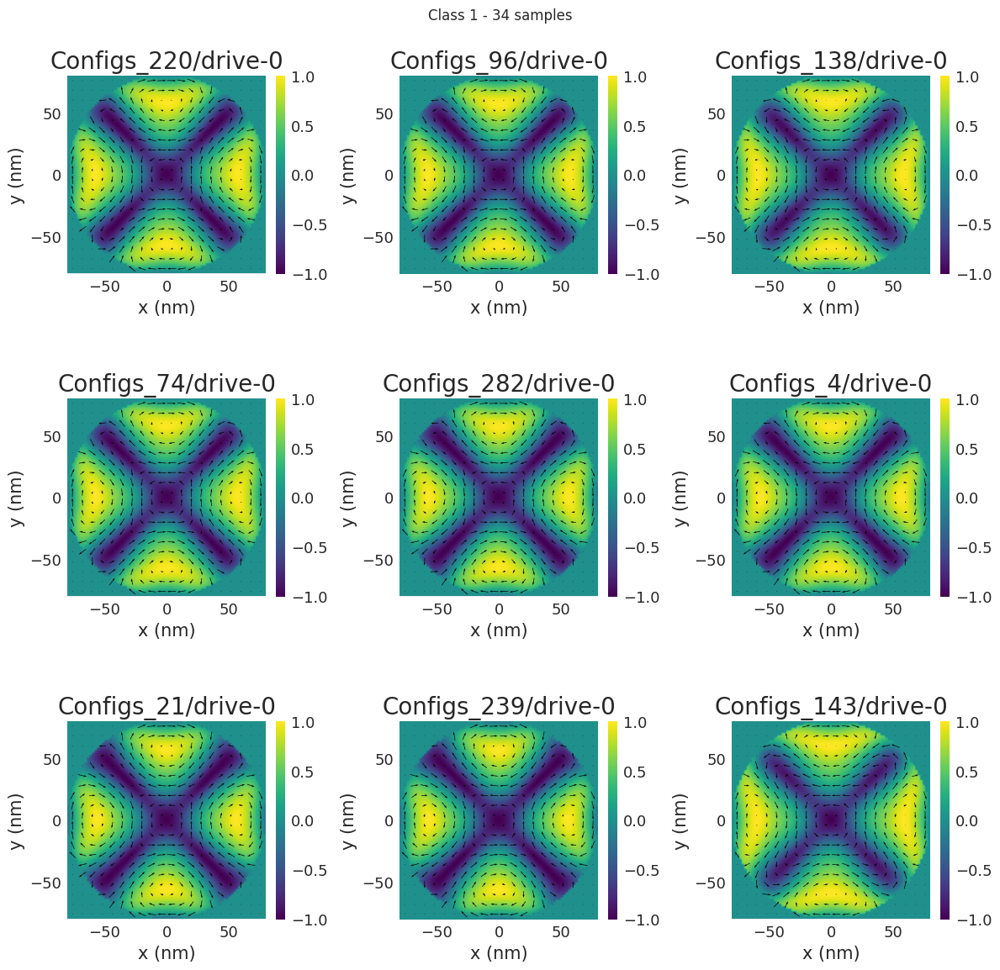

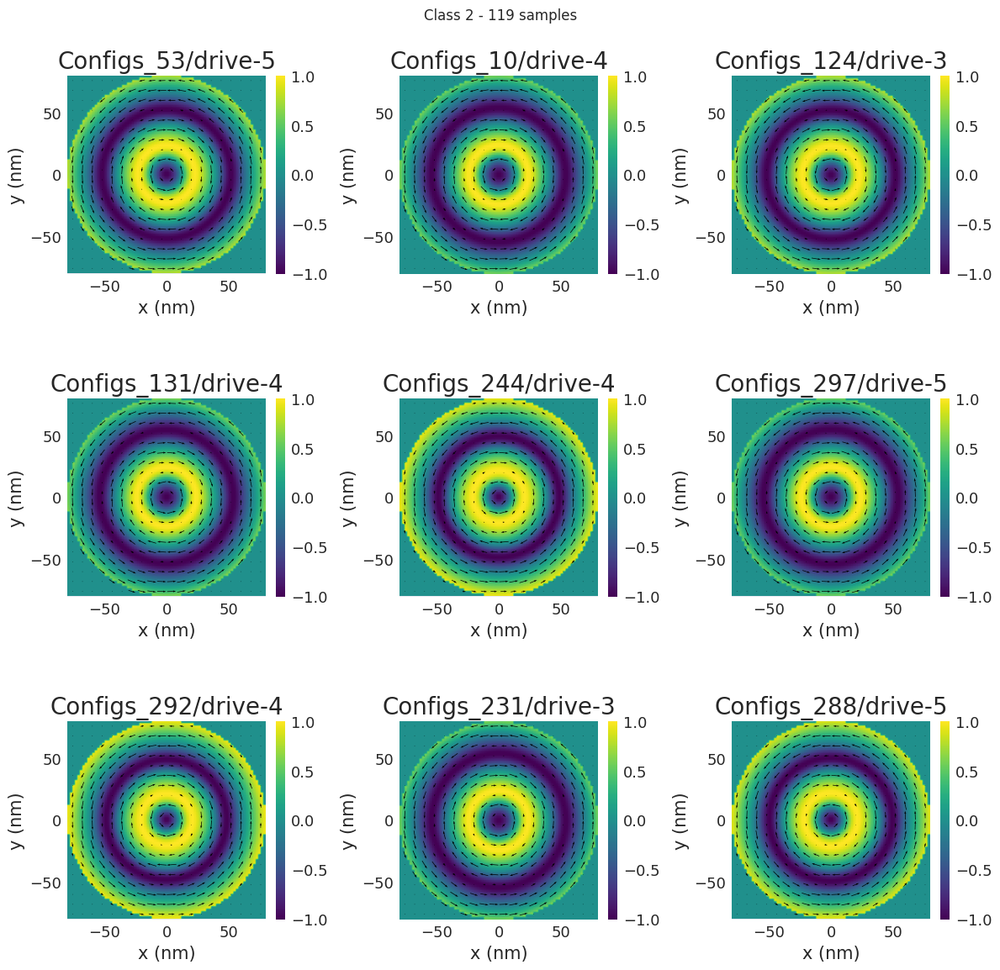

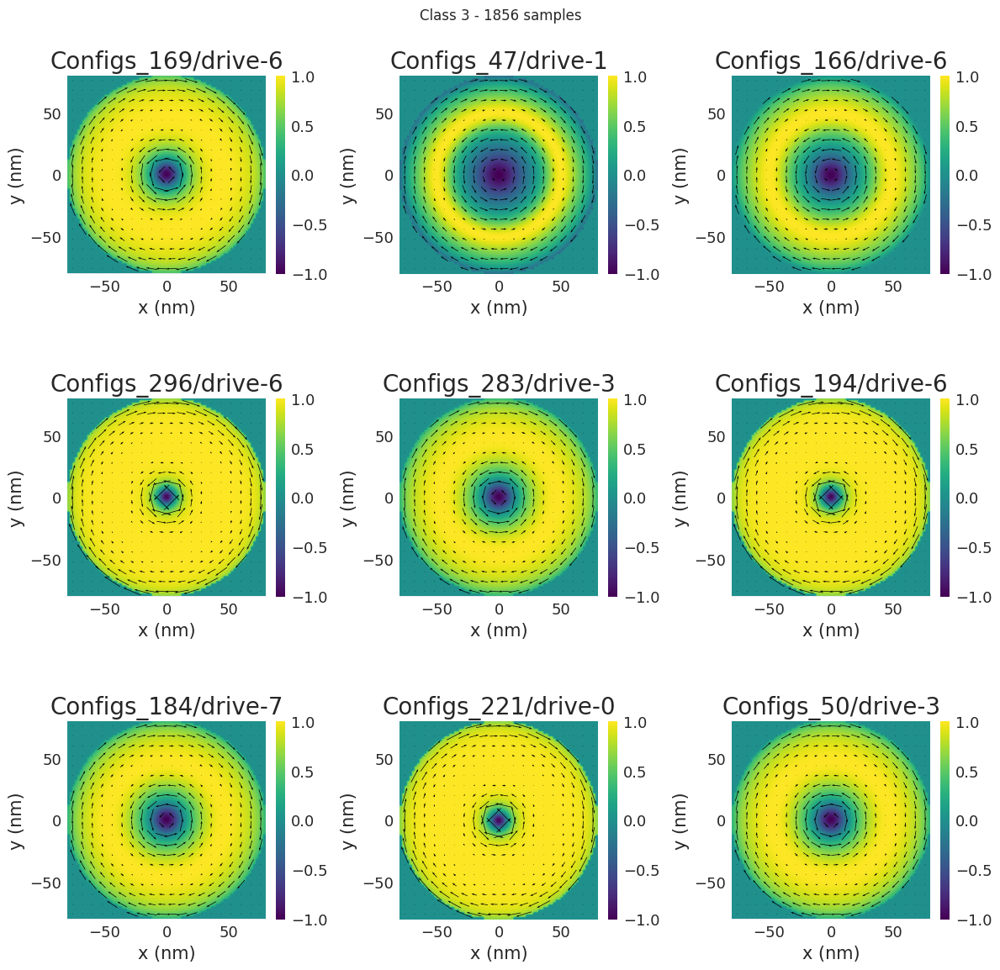

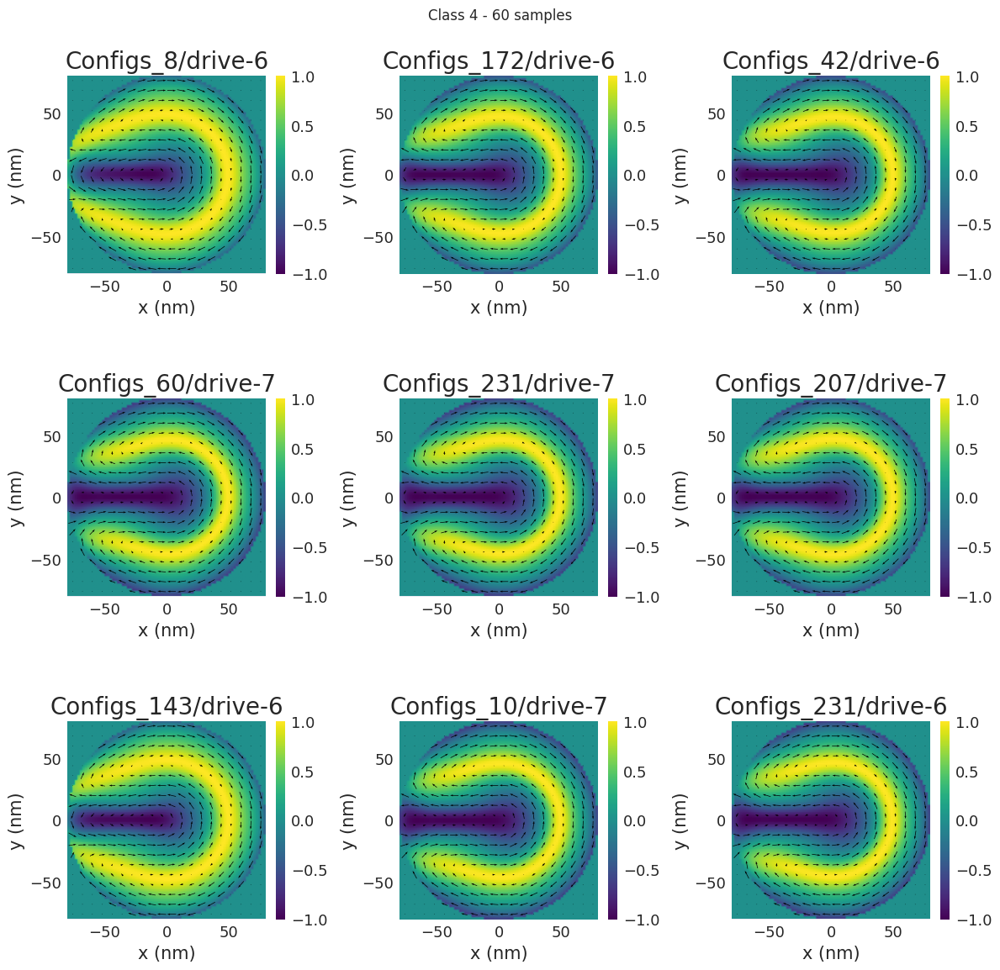

...

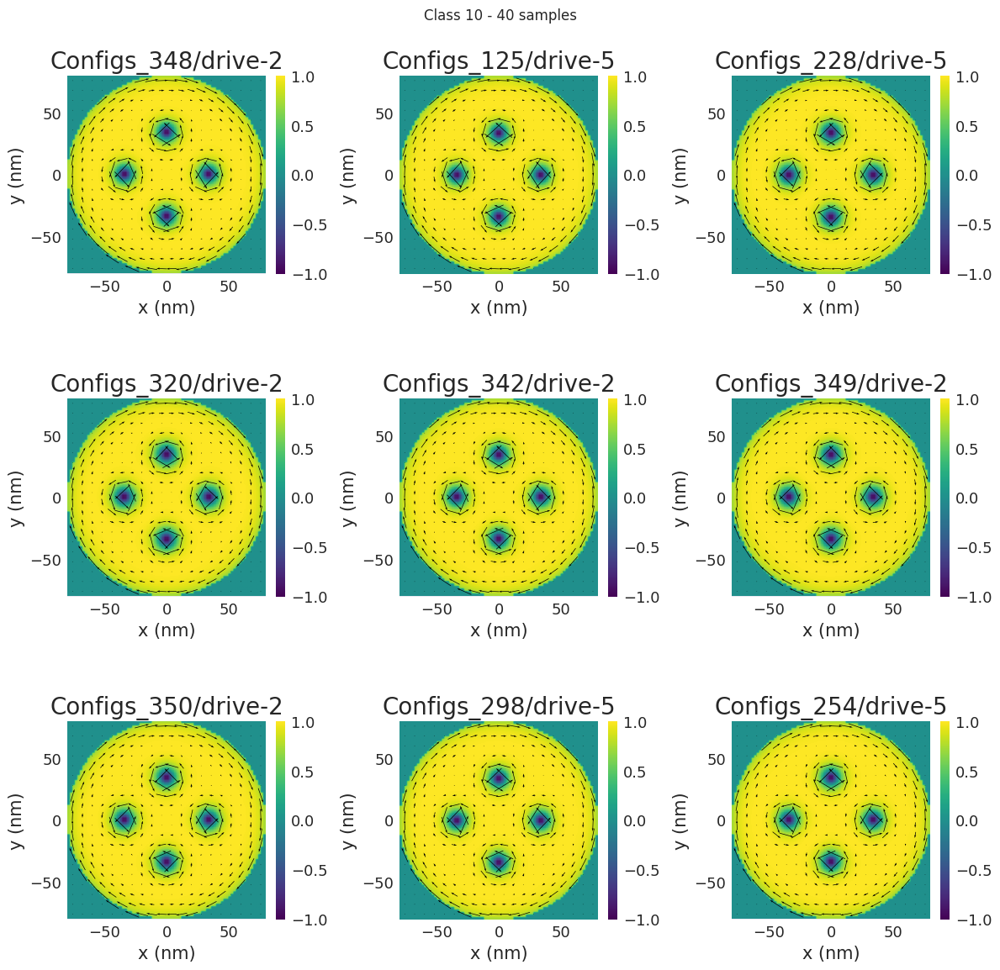

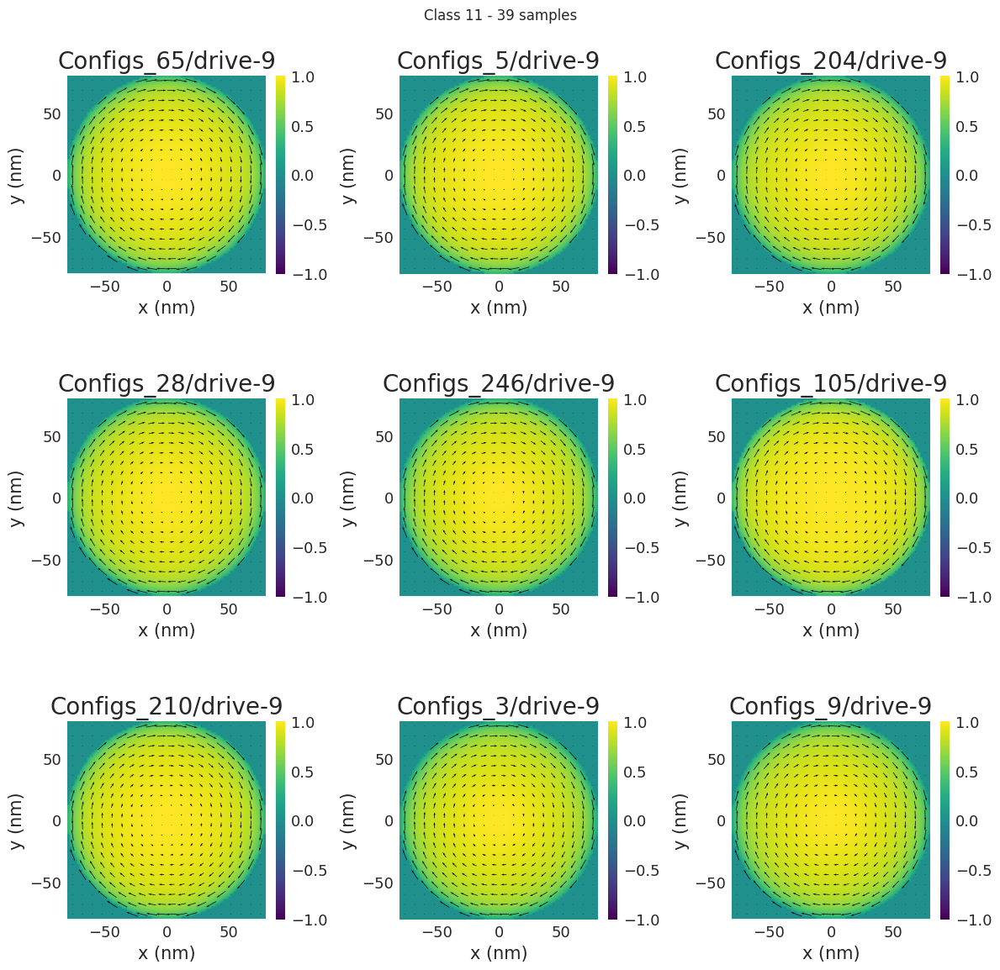

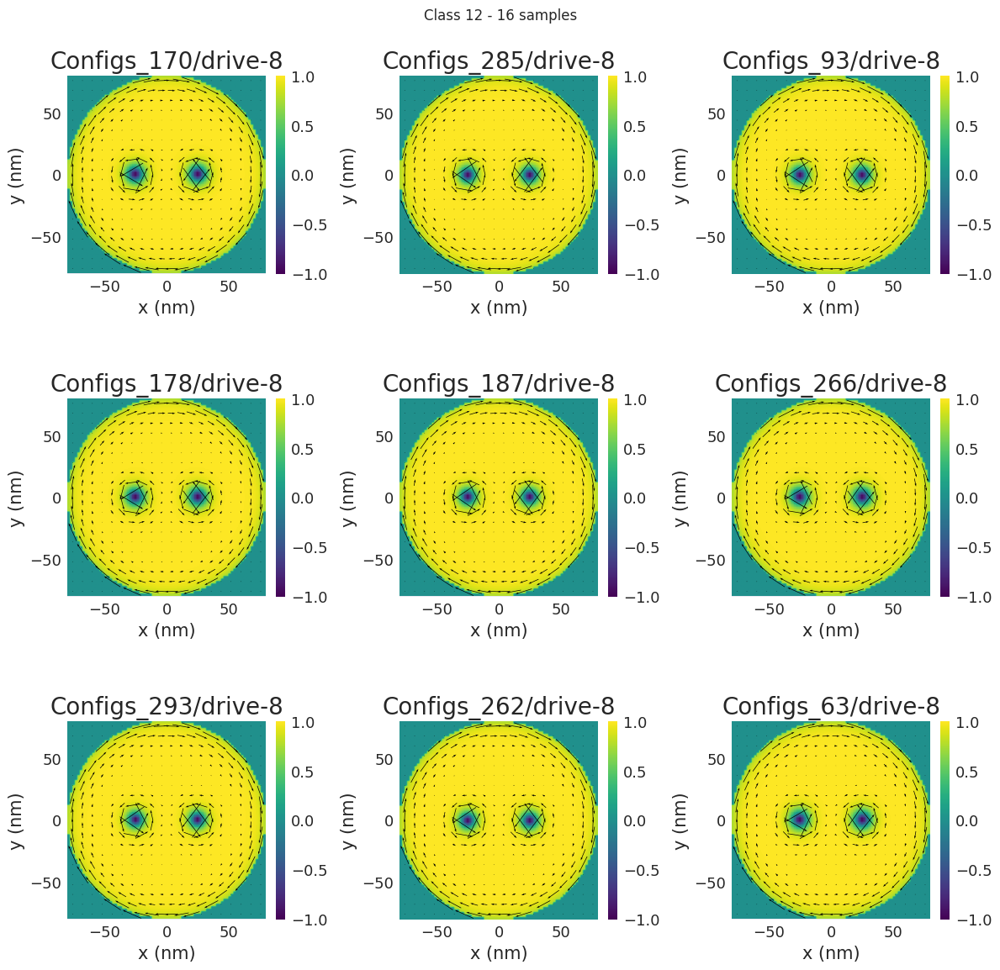

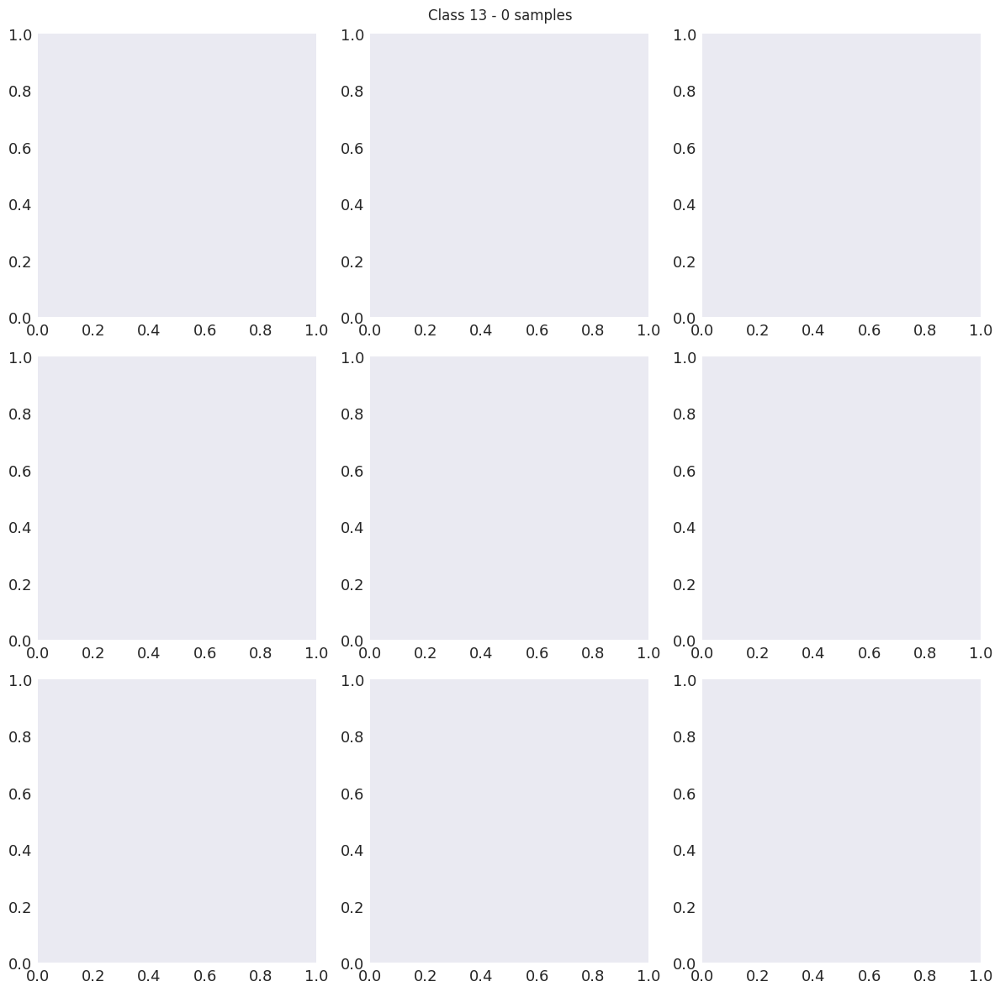

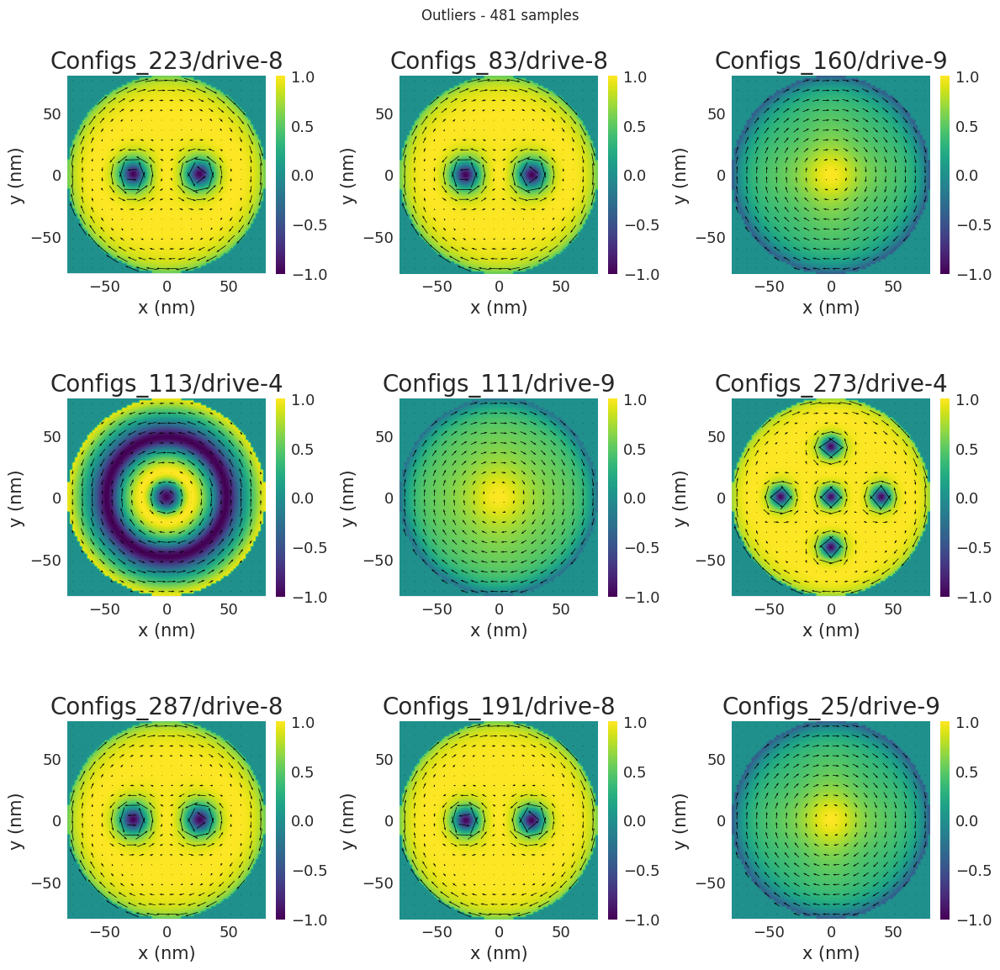

In [38]:
from plotting import plot_all_examples

plot_all_examples(class_dict, parameters_dict)